<a href="https://colab.research.google.com/github/Said-Belhadj/near-duplicate-retrieval/blob/main/near_duplicate_retrieval.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Near Duplicate Retrieval : For Historical Images

## Imports

In [ ]:
import zipfile
import os
import pandas as pd
import math
from PIL import Image
import shutil


import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision.transforms import RandomApply, GaussianBlur
import torchvision.models as models
from sklearn.decomposition import PCA
import numpy as np
from sklearn.model_selection import train_test_split
import torch.optim as optim
from torch.utils.data import DataLoader

import random
from tqdm import tqdm

from google.colab import drive
drive.mount('/content/drive')

In [ ]:
root_folder = '/content/drive/MyDrive/near-deuplicate-project/'
xlsx_file = root_folder + "dataset.xlsx"
image_folder = root_folder + "jpg/"

## Data preparation & Data augmentation

### Dataset building and cleaning

In [ ]:
df = pd.read_excel(xlsx_file, header=None)
df.dropna(axis = 0, how = 'all', inplace = True)

In [ ]:
def count_files(directory):
    # Vérifie si le chemin spécifié est un répertoire
    if not os.path.isdir(directory):
        print("Le chemin spécifié n'est pas un répertoire.")
        return

    # Compte le nombre de fichiers dans le répertoire
    num_files = len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])

    return num_files

# Chemin du répertoire à compter
directory_path = '/content/drive/MyDrive/near-deuplicate-project/dataset_aug'

# Appel de la fonction pour compter le nombre de fichiers
num_files = count_files(directory_path)

print(f"Nombre de fichiers {num_files}")


Nombre de fichiers 0


In [ ]:
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
3,illustracionaristica_19111113_P9_00_02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20,turunsanomat_19111112_P5_01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27,theadelaidechronicle_19120113_P30_00_03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40,perthamboyeveningnews_19111109_P1_01,thechroniclenews_19111116_P1_01,thediamonddrill_19111125_P7_01,thepenascolajournal_19111119_P7_01,theseattlestar_19111102_P6_01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47,DasinferessanteBlatt_19111109_P9_05,eveningbulletin_19111230_P16_01,eveningjournal_19111115_P9_01,illustracionartistica_191111113_P8_00_02,perthamboyeveningnews_19111114_P1_01,thecairobulletin_19111117_P1_01,thepenascolajournal_19111123_02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1790,bataillesyndicaliste_19140219_02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1804,roger-viollet,roger-viollet_2,Pendaison des 14_surplomb_Fonds Roger-Viollet...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1817,lematin_19120127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1833,excelsior_19111228,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
data = []
for index, row in df.iterrows():
    original_image_path = row[0]
    near_duplicate_paths = row[1:].tolist()
    data.append([original_image_path] + near_duplicate_paths)
cleaned_data = [[x for x in inner_list if not isinstance(x, float) or not math.isnan(x)] for inner_list in data]
cleaned_data = [[element.lstrip() for element in inner_list] for inner_list in cleaned_data]
cleaned_data = [[name + ".jpg" for name in sublist] for sublist in cleaned_data]

In [ ]:
cleaned_data

[['illustracionaristica_19111113_P9_00_02.jpg'],
 ['turunsanomat_19111112_P5_01.jpg'],
 ['theadelaidechronicle_19120113_P30_00_03.jpg'],
 ['perthamboyeveningnews_19111109_P1_01.jpg',
  'thechroniclenews_19111116_P1_01.jpg',
  'thediamonddrill_19111125_P7_01.jpg',
  'thepenascolajournal_19111119_P7_01.jpg',
  'theseattlestar_19111102_P6_01.jpg'],
 ['DasinferessanteBlatt_19111109_P9_05.jpg',
  'eveningbulletin_19111230_P16_01.jpg',
  'eveningjournal_19111115_P9_01.jpg',
  'illustracionartistica_191111113_P8_00_02.jpg',
  'perthamboyeveningnews_19111114_P1_01.jpg',
  'thecairobulletin_19111117_P1_01.jpg',
  'thepenascolajournal_19111123_02.jpg'],
 ['perthamboyeveningnews_19111124_P12_01.jpg',
  'thecairobulletin_19111126_P1_02.jpg',
  'thepenascolajournal_19111126_P16_01.jpg'],
 ['liverpooldailypost_19111030_P3_00_01.jpg',
  'thephere_19111104_P6_00_03.jpg'],
 ['dailymirror_19111106_P9_00_03.jpg',
  'Huma_19111114_P1_01.jpg',
  'illustratedlondonnews_19111104_P7_00_04.jpg',
  'KeskiSuomi_

Remove files not found.

In [ ]:
for file_list in cleaned_data:
    not_found_file = []
    for file_name in file_list:
        if not os.path.exists(image_folder+file_name):
            print(f"File not found: {file_name}")
            not_found_file.append(file_name)
    for file_name in not_found_file:
        file_list.remove(file_name)
cleaned_data = [sublist for sublist in cleaned_data if sublist]

File not found: pho_2K47160_24_01.jpg
File not found: pho_2K47161_06_01.jpg
File not found: thephere_19111104_P5_00_03.jpg
File not found: pho_2K47160_05_01.jpg
File not found: pho_2K47160_06_01.jpg
File not found: pho_2K47160_07_01.jpg
File not found: pho_2K47160_08_01.jpg
File not found: pho_2K47161_32_01.jpg
File not found: pho_2K47161_11_01.jpg
File not found: pho_2K47160_13_01.jpg
File not found: pho_2K47160_14_01.jpg
File not found: pho_2K47160_15_01.jpg
File not found: 4_Chérau_8 ou 9 dec 1911_Tripoli_pendaison notable (4).jpg
File not found: btv1b69177422_1.jpg
File not found: btv1b6917753v_1.jpg
File not found: btv1b53231689n_1.jpg
File not found: Analogue_Coll Schill_carte postale_pendaison des 14_6 dec 1911 (2).jpg
File not found: 3_Chérau_6 dec 1911_Tripoli_pendaison des 14 (2).jpg
File not found: Analogue_Coll Schill_Carte postale_pendaison des 14_6 dec 1911.jpg
File not found: pho_2K47160_22_01.jpg
File not found: pho_2K47160_23_01.jpg
File not found: pho_2K47161_22_01.

Create the structure of the dataset like this :


*  Class i
  * filename_1.jpg
  * filename_2.jpg
  * filename_3.jpg
  * filename_4.jpg
*  Class i+1
  * filename_1.jpg
  * filename_2.jpg
  * filename_3.jpg
  * filename_4.jpg
  



In [ ]:
#!rm -r /content/drive/MyDrive/near-deuplicate-project/dataset

In [ ]:
def create_directory_structure(parent_dir, nested_list):
    for i, sublist in enumerate(nested_list, start=1):
        class_dir = os.path.join(parent_dir, f"class_{i}")
        os.makedirs(class_dir, exist_ok=True)
        for image_path in sublist:
            _, image_name = os.path.split(image_path)
            shutil.move(image_folder+image_path, os.path.join(class_dir, image_name))

parent_folder = root_folder+"dataset/"
create_directory_structure(parent_folder, cleaned_data)


### Data Augmentation

In [ ]:
def convert_to_rgb(image):
    if image.mode != 'RGB':
        image = image.convert('RGB')
    return image

def data_augmentation(parent_dir, output_parent_dir, num_images_per_folder=10):
    # Define transformations
    transform = transforms.Compose([
        transforms.Lambda(convert_to_rgb),  # Convert image to RGB mode if necessary
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        #transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        #transforms.RandomResizedCrop(size=(224, 224), scale=(0.8, 1.0)),
        transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
        transforms.RandomPerspective(distortion_scale=0.2),
        transforms.RandomApply([GaussianBlur(kernel_size=5)], p=0.5),
        transforms.ToTensor()
    ])

    # Iterate through each class subfolder in the parent directory
    for class_folder in os.listdir(parent_dir):
        class_path = os.path.join(parent_dir, class_folder)
        output_class_path = os.path.join(output_parent_dir, class_folder)

        # Create output class directory if it doesn't exist
        os.makedirs(output_class_path, exist_ok=True)

        # Iterate through each image in the class folder
        for image_file in os.listdir(class_path):
            if image_file.endswith(('.jpg', '.jpeg', '.png')):
                # Open the image
                image_path = os.path.join(class_path, image_file)
                image = Image.open(image_path)

                # Save original image after converting to suitable mode
                original_output_path = os.path.join(output_class_path, image_file)
                image = convert_to_rgb(image)  # Convert to RGB mode if necessary
                image.save(original_output_path)

                # Apply transformations and save augmented images
                for i in range(num_images_per_folder):
                    augmented_image = transform(image)
                    output_filename = f"{os.path.splitext(image_file)[0]}_aug_{i}.jpg"
                    output_path = os.path.join(output_class_path, output_filename)
                    transforms.functional.to_pil_image(augmented_image).save(output_path)

data_augmentation(root_folder+"dataset", root_folder+"dataset_aug", num_images_per_folder=10)


# Model & Training :

In [ ]:
class TransferLearningModel(nn.Module):
    def __init__(self):
        super(TransferLearningModel, self).__init__()
        self.resnet = models.resnet18(pretrained=True)
        #self.resnet = models.resnet34(weights="IMAGENET1K_V1")
        # Remove the last classification layer
        self.resnet.fc = nn.Identity()

    def forward(self, x):
        return self.resnet(x)



In [ ]:
class NearDuplicateDataset(torch.utils.data.Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = self._load_image_paths()

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        anchor_path = self.image_paths[idx]
        anchor_img = Image.open(anchor_path).convert('RGB')
        # Find a near duplicate image (randomly chosen)
        positive_path = self._find_near_duplicate(anchor_path)
        positive_img = Image.open(positive_path).convert('RGB')

        # Find a negative image (from a different folder)
        negative_path = self._find_negative(anchor_path)
        negative_img = Image.open(negative_path).convert('RGB')

        if self.transform:
            anchor_img = self.transform(anchor_img)
            positive_img = self.transform(positive_img)
            negative_img = self.transform(negative_img)

        return anchor_img, positive_img, negative_img

    def _load_image_paths(self):
        image_paths = []
        for root, _, files in os.walk(self.root_dir):
            for file in files:
                image_paths.append(os.path.join(root, file))
        return image_paths

    def _find_near_duplicate(self, anchor_path):
        anchor_folder = os.path.dirname(anchor_path)
        # Filter images in the same folder (excluding the anchor image)
        candidate_paths = [path for path in self.image_paths if os.path.dirname(path) == anchor_folder and path != anchor_path]
        # Randomly choose a near duplicate image
        return random.choice(candidate_paths)

    def _find_negative(self, anchor_path):
        # Filter images from different folders
        candidate_paths = [path for path in self.image_paths if os.path.dirname(path) != os.path.dirname(anchor_path)]
        # Randomly choose a negative image
        return random.choice(candidate_paths)


def train(model, train_loader, criterion, optimizer, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        train_loader_with_progress = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')
        for anchor, positive, negative in train_loader_with_progress:
            anchor, positive, negative = anchor.cuda(), positive.cuda(), negative.cuda()
            optimizer.zero_grad()
            output_anchor = model(anchor)
            output_positive = model(positive)
            output_negative = model(negative)
            loss = criterion(output_anchor, output_positive, output_negative)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            train_loader_with_progress.set_postfix({'loss': running_loss / len(train_loader)})  # Update progress bar with loss
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader)}")



In [ ]:
def save_model_weights(model, file_path):
    torch.save(model.state_dict(), file_path)
    print(f"Model weights saved to '{file_path}'")

Model weights saved to '/content/drive/MyDrive/near-deuplicate-project/weight/model_resnet18_65_epochs.pth'


In [ ]:
model = TransferLearningModel()
model = model.cuda()

# loss function and optimizer
criterion = nn.TripletMarginLoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

# data transformations
transform = transforms.Compose([
    transforms.Resize((400, 400)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = NearDuplicateDataset(root_dir='/content/drive/MyDrive/near-deuplicate-project/dataset_aug/', transform=transform)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

train(model, train_loader, criterion, optimizer, num_epochs=65)

save_model_weights(model, '/content/drive/MyDrive/near-deuplicate-project/weight/model_resnet18_65_epochsv2.pth')

# Test & Predictions

In [ ]:
def preprocess_image(image_path, transform):
    image = Image.open(image_path).convert('RGB')
    image = transform(image)
    image = image.unsqueeze(0)  # Add batch dimension
    return image

def compute_similarity(input_embedding, dataset_embeddings):
    with torch.no_grad():
        similarities = torch.nn.functional.cosine_similarity(input_embedding, dataset_embeddings, dim=1)
    return similarities

def find_similar_images(input_image_path, model, dataset, transform, n=5, n_components=256):
    # Preprocess the input image
    input_image = preprocess_image(input_image_path, transform)
    input_image = input_image.cuda()

    # Compute embedding for the input image
    input_embedding = model(input_image)

    # Compute embeddings for all images in the dataset
    dataset_embeddings = []
    for anchor, _, _ in dataset:
        anchor = anchor.unsqueeze(0).cuda()
        embedding = model(anchor)
        dataset_embeddings.append(embedding)
    dataset_embeddings = torch.cat(dataset_embeddings)

    # Apply PCA to reduce dimensionality
    pca = PCA(n_components=n_components)
    dataset_embeddings_pca = pca.fit_transform(dataset_embeddings.cpu().detach().numpy())

    # Compute similarity between input image and dataset images
    input_embedding_pca = pca.transform(input_embedding.cpu().detach().numpy())
    similarities = compute_similarity(torch.tensor(input_embedding_pca), torch.tensor(dataset_embeddings_pca))

    # Get indices of top n similar images
    top_n_indices = similarities.argsort(descending=True)[:n]

    # Return paths of top n similar images and their similarity scores
    similar_image_paths = [dataset.image_paths[i] for i in top_n_indices]
    similarity_scores = [similarities[i].item() for i in top_n_indices]

    # Return similarity scores for all images
    all_similarity_scores = {dataset.image_paths[i]: similarities[i].item() for i in range(len(dataset))}

    return similar_image_paths, similarity_scores, all_similarity_scores


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Similarity scores for all images:
/content/drive/MyDrive/near-deuplicate-project/test/class_35/thewaxahachiedailylight_19111124_P2_02.jpg: -0.04857376962900162
/content/drive/MyDrive/near-deuplicate-project/test/class_35/thewaxahachiedailylight_19111124_P2_02_aug_0.jpg: 0.037489153444767
/content/drive/MyDrive/near-deuplicate-project/test/class_35/thewaxahachiedailylight_19111124_P2_02_aug_1.jpg: 0.050384681671857834
/content/drive/MyDrive/near-deuplicate-project/test/class_35/thewaxahachiedailylight_19111124_P2_02_aug_2.jpg: -0.15798060595989227
/content/drive/MyDrive/near-deuplicate-project/test/class_35/thewaxahachiedailylight_19111124_P2_02_aug_3.jpg: -0.00825759582221508
/content/drive/MyDrive/near-deuplicate-project/test/class_35/thewaxahachiedailylight_19111124_P2_02_aug_4.jpg: 0.09792602062225342
/content/drive/MyDrive/near-deuplicate-project/test/class_35/thewaxahachiedailylight_19111124_P2_02_aug_5.jpg: -0.06794974952936172
/content/drive/MyDrive/near-deuplicate-project/test/

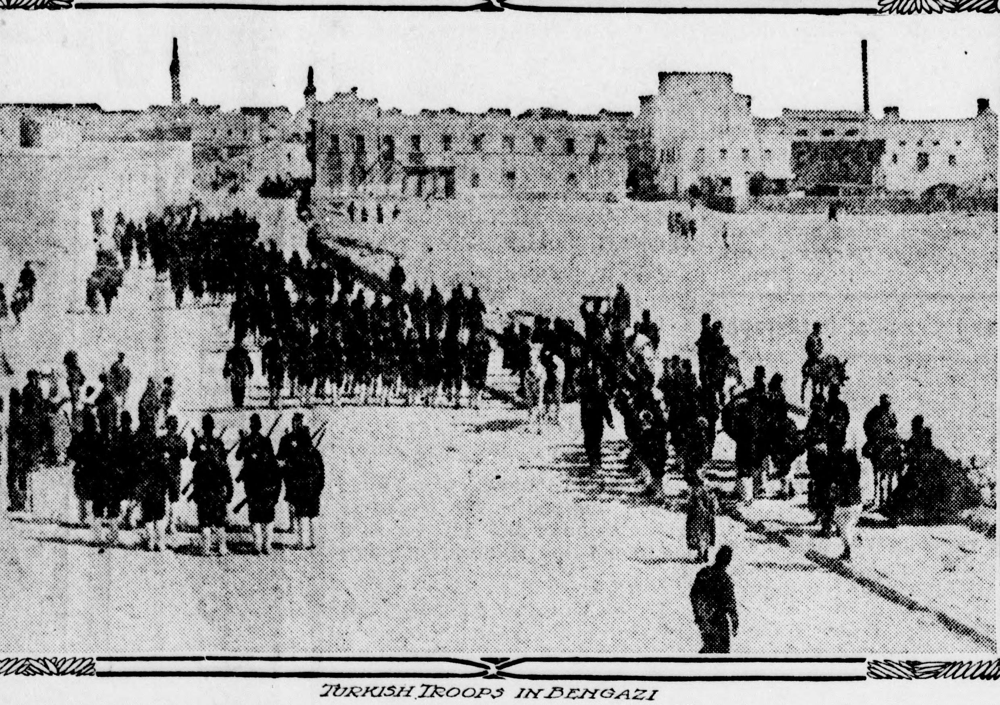

Top 5 similar images:
Similarity Score: 1.000000238418579
Image path: /content/drive/MyDrive/near-deuplicate-project/test/class_39/theheraldadvance_19111110_P6_01.jpg


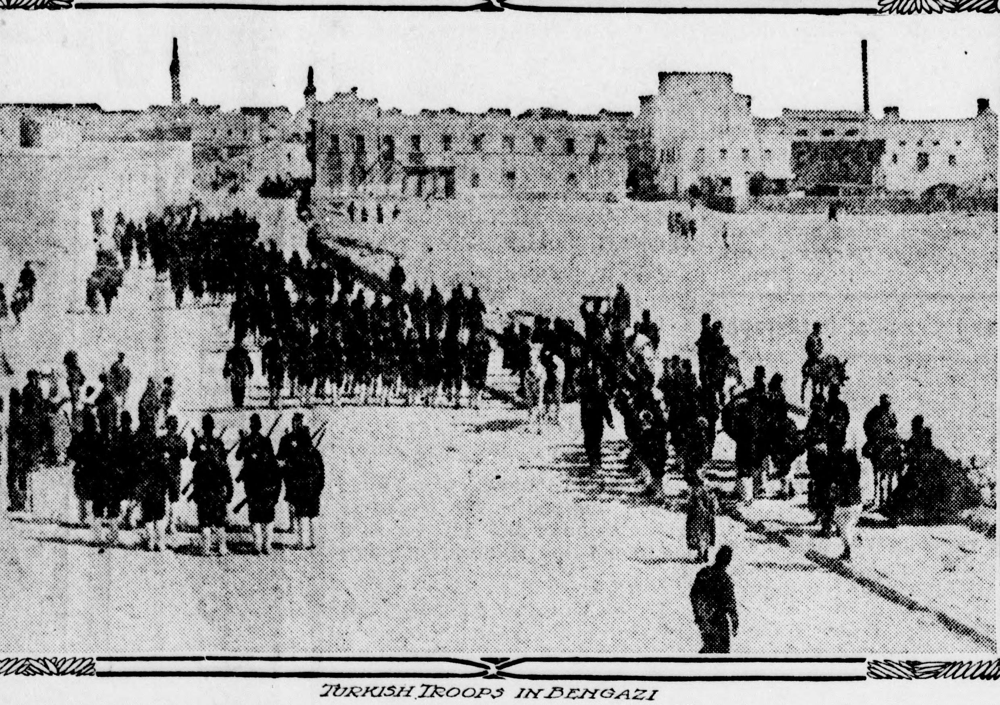

Similarity Score: 0.6738022565841675
Image path: /content/drive/MyDrive/near-deuplicate-project/test/class_39/thenorthplatesemixeeklytribune_19111121_P7_01.jpg


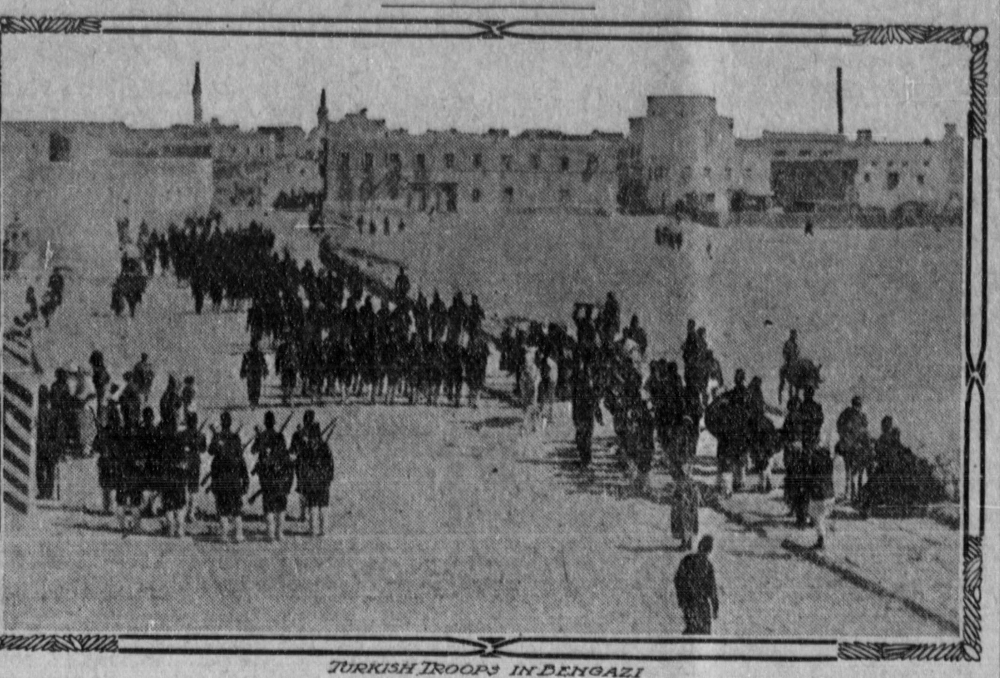

Similarity Score: 0.4993773400783539
Image path: /content/drive/MyDrive/near-deuplicate-project/test/class_40/thewheelingintelligencer_19111120_P1_01_aug_8.jpg


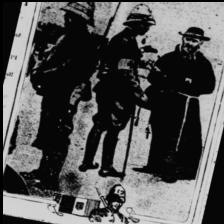

Similarity Score: 0.4718797206878662
Image path: /content/drive/MyDrive/near-deuplicate-project/test/class_39/theheraldadvance_19111110_P6_01_aug_4.jpg


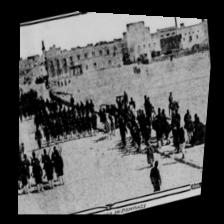

Similarity Score: 0.4349824786186218
Image path: /content/drive/MyDrive/near-deuplicate-project/test/class_39/thenorthplatesemixeeklytribune_19111121_P7_01_aug_0.jpg


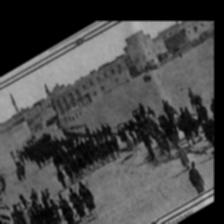

In [ ]:
model = TransferLearningModel().cuda()
model.load_state_dict(torch.load('/content/drive/MyDrive/near-deuplicate-project/weight/model_resnet18_65_epochs.pth'))
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
dataset = NearDuplicateDataset(root_dir='/content/drive/MyDrive/near-deuplicate-project/test', transform=transform)

input_image_path = '/content/drive/MyDrive/near-deuplicate-project/test/class_39/theheraldadvance_19111110_P6_01.jpg'

similar_images, similarity_scores, all_similarity_scores = find_similar_images(input_image_path, model, dataset, transform, n=5)

# Print all similarity scores
print("Similarity scores for all images:")
for image_path, score in all_similarity_scores.items():
    print(f"{image_path}: {score}")

# Display input image
input_image = Image.open(input_image_path)
display(input_image)

# Print top similar images and their similarity scores
print("Top 5 similar images:")
for image_path, score in zip(similar_images, similarity_scores):
    print(f"Similarity Score: {score}")
    print(f"Image path: {image_path}")
    image = Image.open(image_path)
    display(image)
